<a href="https://colab.research.google.com/github/nataliasbsg/Transfer_Learning_Animals/blob/main/src/Redes_Entrenadas/Mobilenet_V3/TFM_RedCervidos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Importación de archivos desde drive
from google.colab import drive

# Tratamiento de imágenes
import numpy as np
import cv2
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import shutil
from PIL import Image

# Librerías para la red
import tensorflow as tf
import tensorflow_datasets as tensorflow_datasets
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow import keras

# Interacción con ejemplos en URLs
import requests
from io import BytesIO

# Display
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm

from datetime import datetime


# Lectura de imágenes desde Drive
Se accede a las imagenes contenidas en Drive. En este caso hay tres niveles de carpetas:
1. Base de Datos general. Una sola carpeta que contiene todas las familias de animales que se quieren estudiar. Por ejemplo: "Base de datos de animales".
2. Conjunto de carpetas de familias de animales que a su vez contienen las carpetas de especies animales de la misma familia (categories). Por ejemplo:  dentro de "Base de datos de animales" encontraríamos "Cánidos" y "Felinos".
3. Conjunto de carpetas de especies animales (subcategories). Contienen las imagenes con las que se va a trabajar. Por ejemplo: dentro de "Felinos" encontraríamos "Linces" y "Gatos".


Se estudiará la familias de los cérvidos.

En este caso las especies son las siguientes:
0. Cervus elaphus: ciervo.
1. Dama dama: gamo.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Dirección de la carpeta contenedora con la que se quiere trabajar
dir_train = '../content/drive/MyDrive/Colab Notebooks/BD_Familia/Cervidos' # path to directory with the images

# Se leen las carpetas contenidas en la direccion anterior y se ordenan y guardan en categories
categories = sorted(os.listdir(dir_train))
print('Las categorias de Cervidos son:', categories)
categories_folders = [os.path.join(dir_train, categorie) for categorie in categories]

Las categorias de Cervidos son: ['Ciervo', 'Gamo']


In [ ]:
# Se inicializan variables 
num_images = [] # Guardara el numero de imagenes de cada categoria
subcategories = [] # Guardara las subcategorias de cada categoria (subcarpetas)

for categorie in categories:
  num_images_sub = 0
  # Se leen las subcarpetas de las carpetas (las especies de las familias)
  # subcategories.append(sorted(os.listdir('/content/drive/MyDrive/Colab Notebooks/BD_Familia/{}'.format(categorie))))

  try:
    # Se crean directorios en la maquina virtual
    os.makedirs("dataset/{}".format(categorie))
  except:
    pass

  # for subcategorie in subcategories[categories.index(categorie)]:
  num_images_sub = num_images_sub + len(os.listdir('/content/drive/MyDrive/Colab Notebooks/BD_Familia/Cervidos/{}'.format(categorie)))

  # Se guarda el numero de imagenes de cada categoria (familia)
  num_images.append(num_images_sub)

print('El numero de imagenes de cada categoria es:', num_images)

# Se establece un limite con la carpeta con el menor numero de imagenes 
limit_image = min(num_images)
print('Se utilizarán', limit_image, 'imagenes de cada categoria')


El numero de imagenes de cada categoria es: [1611, 1251]
Se utilizarán 1251 imagenes de cada categoria


In [ ]:
# Se limita el numero de imagenes para equilibrar las clases
for i, categorie in enumerate(categories):
  carpeta_fuente = '/content/drive/MyDrive/Colab Notebooks/BD_Familia/Cervidos/{}'.format(categorie)
  carpeta_destino = '/content/dataset/{}'.format(categorie)
  # carpeta_test = '/content/test/{}'.format(categorie)
  imagenes = [img for j, img in enumerate(os.listdir(carpeta_fuente)) if j<limit_image]
  # imagenes, img_test = train_test_split(imagenes, test_size = 0.1, shuffle = True)
  # print('El numero de imagenes guardadas para test de la categoria', categorie, 'es', len(img_test))
  for nombreimg in imagenes:
    path = os.path.join('/content/drive/MyDrive/Colab Notebooks/BD_Familia/Cervidos/{}'.format(categorie), nombreimg)
    shutil.copy(path, carpeta_destino + '/' + nombreimg)


Found 2002 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


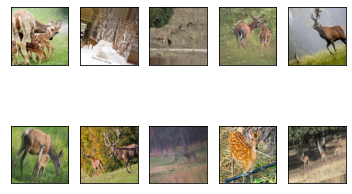

In [ ]:
#Crear el dataset generador

datagen = ImageDataGenerator(
    rescale = 1. / 255,
    rotation_range = 20,
    zoom_range = 0.2,
    width_shift_range = 0.05,
    height_shift_range = 0.05,
    shear_range = 0.05,
    horizontal_flip=True,
    fill_mode = 'nearest',
    validation_split = 0.2 #20% para pruebas
)

#Generadores para sets de entrenamiento y pruebas
data_gen_entrenamiento = datagen.flow_from_directory('/content/dataset', target_size=(224,224),
                                                     batch_size=32, shuffle=True, subset='training')
data_gen_pruebas = datagen.flow_from_directory('/content/dataset', target_size=(224,224),
                                                     batch_size=32, shuffle=True, subset='validation')

#Imprimir 10 imagenes del generador de entrenamiento
for imagen, etiqueta in data_gen_entrenamiento:
  for i in range(10):
    plt.subplot(2,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i])
  break
plt.show()


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

url = "https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5"
mobilenetv3 = hub.KerasLayer(url, input_shape=(224,224,3))

In [ ]:
#Congelar el modelo descargado
mobilenetv3.trainable = False

In [ ]:
modelo = tf.keras.Sequential([
    mobilenetv3,
    tf.keras.layers.Dense(len(categories), activation='softmax')
])

In [ ]:
modelo.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5508713   
                                                                 
 dense (Dense)               (None, 2)                 2004      
                                                                 
Total params: 5,510,717
Trainable params: 2,004
Non-trainable params: 5,508,713
_________________________________________________________________


In [ ]:
log_dir = "logs/fit/"
checkpoint_filepath = 'tmp/checkpoint'
callback = [tf.keras.callbacks.ModelCheckpoint (filepath=checkpoint_filepath,
                                                save_weights_only=True,
                                                monitor='val_accuracy',
                                                mode='max',
                                                save_best_only=True),
                                                
            tf.keras.callbacks.EarlyStopping (monitor='val_accuracy',
                                              min_delta=0,
                                              verbose=1, 
                                              patience=10),
            
            tf.keras.callbacks.TensorBoard (log_dir=log_dir, 
                                            histogram_freq=1),
            
            tf.keras.callbacks.BackupAndRestore (backup_dir="tmp")
            ]

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
#Compilar modelo
modelo.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
EPOCAS = 30

historial = modelo.fit(
    data_gen_entrenamiento, epochs=EPOCAS, callbacks=[callback], batch_size=32,
    validation_data=data_gen_pruebas
)

Epoch 1/30
63/63 [==============================] - 136s 2s/step - loss: 0.4721 - accuracy: 0.7937 - val_loss: 0.3192 - val_accuracy: 0.8680
Epoch 2/30
63/63 [==============================] - 115s 2s/step - loss: 0.2338 - accuracy: 0.9061 - val_loss: 0.2963 - val_accuracy: 0.8820
Epoch 3/30
63/63 [==============================] - 112s 2s/step - loss: 0.1904 - accuracy: 0.9306 - val_loss: 0.2864 - val_accuracy: 0.8900
Epoch 4/30
63/63 [==============================] - 129s 2s/step - loss: 0.1691 - accuracy: 0.9376 - val_loss: 0.2898 - val_accuracy: 0.8800
Epoch 5/30
63/63 [==============================] - 113s 2s/step - loss: 0.1610 - accuracy: 0.9386 - val_loss: 0.2907 - val_accuracy: 0.8780
Epoch 6/30
63/63 [==============================] - 113s 2s/step - loss: 0.1480 - accuracy: 0.9436 - val_loss: 0.3084 - val_accuracy: 0.8780
Epoch 7/30
63/63 [==============================] - 130s 2s/step - loss: 0.1487 - accuracy: 0.9436 - val_loss: 0.3261 - val_accuracy: 0.8640
Epoch 8/30
63

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [ ]:
# modelo.load_weights(checkpoint_filepath)
# print(checkpoint_filepath)

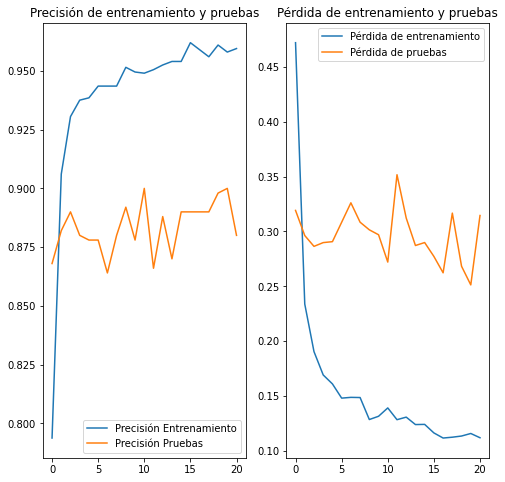

El valor máximo de la precisión en pruebas se da en la época: 10
Donde el valor de los parámetros principales son los siguientes:
El valor máximo de la precisión en pruebas es: 0.9000
El valor de pérdidas en pruebas es: 0.2721
El valor de precisión en entrenamiento es: 0.9491
El valor de pérdidas en  entrenaminto es: 0.9000


In [ ]:
#Mostrar resultados con graficas de precisión
acc = historial.history['accuracy']
val_acc = historial.history['val_accuracy']

loss = historial.history['loss']
val_loss = historial.history['val_loss']

rango_epocas = range(len(val_loss))

plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(rango_epocas, acc, label='Precisión Entrenamiento')
plt.plot(rango_epocas, val_acc, label='Precisión Pruebas')
plt.legend(loc='lower right')
plt.title('Precisión de entrenamiento y pruebas')

plt.subplot(1,2,2)
plt.plot(rango_epocas, loss, label='Pérdida de entrenamiento')
plt.plot(rango_epocas, val_loss, label='Pérdida de pruebas')
plt.legend(loc='upper right')
plt.title('Pérdida de entrenamiento y pruebas')
plt.show()

max_val_acc = (max(val_acc))
index = val_acc.index(max_val_acc)

print('El valor máximo de la precisión en pruebas se da en la época:', index)
print('Donde el valor de los parámetros principales son los siguientes:')
print('El valor máximo de la precisión en pruebas es: {:.4f}'.format(val_acc [index]))
print('El valor de pérdidas en pruebas es: {:.4f}'.format(val_loss [index]))
print('El valor de precisión en entrenamiento es: {:.4f}'.format(acc [index]))
print('El valor de pérdidas en  entrenaminto es: {:.4f}'.format(val_acc [index]))


In [ ]:
#Categorizar una imagen de internet
from PIL import Image
import requests
from io import BytesIO
import cv2

def categorizar(url):
  respuesta = requests.get(url)
  img = Image.open(BytesIO(respuesta.content))
  img = np.array(img).astype(float)/255

  img = cv2.resize(img, (224,224))
  prediccion = modelo.predict(img.reshape(-1, 224, 224, 3))
  return np.argmax(prediccion[0], axis=-1)


In [ ]:
# #Crear la carpeta para exportarla a TF Serving
# !mkdir -p /content/carpeta_salida/modelo_animales/1
# #Guardar el modelo en formato SavedModel
# modelo.save('/content/carpeta_salida/modelo_animales/1')
# #Hacerlo un zip para bajarlo y usarlo en otro lado
# !zip -r /content/drive/MyDrive/carpeta_salida/modelo_animales.zip /content/carpeta_salida/modelo_animales/1

In [ ]:
modelo.save('/content/drive/MyDrive/carpeta_salida/modelo_animales/clasificador_cérvidos.h5')

In [ ]:
modelo = tf.keras.models.load_model('/content/drive/MyDrive/carpeta_salida/modelo_animales/clasificador_cérvidos.h5',custom_objects={'KerasLayer':hub.KerasLayer})

In [ ]:
# !rm -r /content/drive/MyDrive/carpeta_salida/modelo_animales

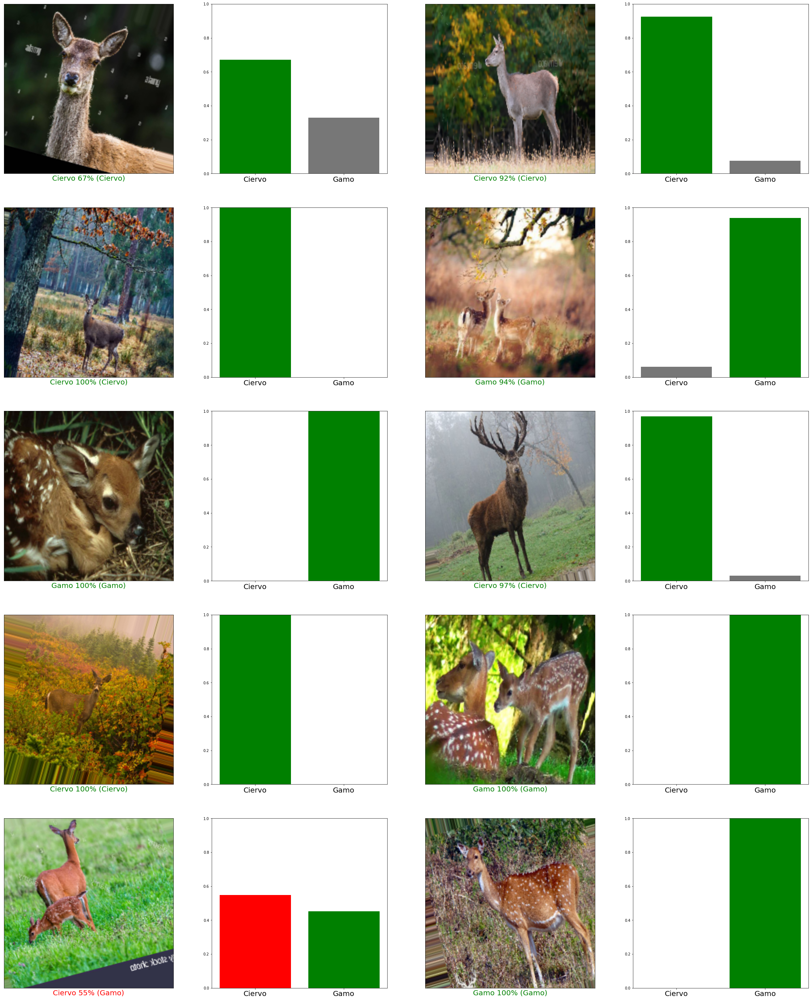

In [ ]:
#Pintar imagenes con predicciones, y marcar si son correctas (verde) o incorrectas (roja)
predicciones_prueba = []
imagenes_prueba= []
etiquetas_prueba= []
color = []

filas = 5
columnas = 2
num_imagenes = filas*columnas

for imagen_prueba, etiqueta_prueba in data_gen_pruebas:
  for i in range(num_imagenes):
      imagen_prueba[i] = np.array(imagen_prueba[i]).astype(float)
      imagenes_prueba.append (imagen_prueba[i])
      etiquetas_prueba.append (etiqueta_prueba[i])
      predicciones_prueba.append(modelo.predict(imagenes_prueba[i].reshape(-1, 224, 224, 3)))
      etiqueta_prediccion = int(np.argmax(predicciones_prueba[i], axis=-1))
      etiqueta_real = np.argmax(etiqueta_prueba[i])
      if etiqueta_prediccion == etiqueta_real: 
        color.append ('green')
      else:
        color.append ('red')
  break
  plt.show()

  
def graficar_imagen(i, predicciones_prueba, etiquetas_reales, imagenes):
  arr_predicciones, etiqueta_real, img = predicciones_prueba[i], etiquetas_reales[i], imagenes[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  etiqueta_prediccion = int(np.argmax(predicciones_prueba[i], axis=-1))
  etiqueta_real = np.argmax(etiqueta_real)

  plt.xlabel("{} {:2.0f}% ({})".format(categories[etiqueta_prediccion],
                                100*np.max(arr_predicciones),
                                categories[etiqueta_real]),
                                color=color[i], fontsize=20)
  
def graficar_valor_arreglo(i, predicciones_prueba, etiqueta_real):
  arr_predicciones, etiqueta_real = predicciones_prueba[i], etiqueta_real[i]
  plt.grid(False)
  # plt.xticks([])
  # plt.yticks([])
  plt.xticks(fontsize=20)
  grafica = plt.bar(categories, arr_predicciones[0], color="#777777")
  plt.ylim([0, 1]) 
  etiqueta_real = np.argmax(etiqueta_real)
  etiqueta_prediccion = int(np.argmax(arr_predicciones[0], axis=-1))
  grafica[etiqueta_real].set_color('green')
  grafica[etiqueta_prediccion].set_color(color[i])
  

plt.figure(figsize=(20*columnas, 10*filas))
for i in range(num_imagenes):
  plt.subplot(filas, 2*columnas, 2*i+1)
  graficar_imagen(i, predicciones_prueba, etiquetas_prueba, imagenes_prueba)
  plt.subplot(filas, 2*columnas, 2*i+2)
  graficar_valor_arreglo(i, predicciones_prueba, etiquetas_prueba)